In [1]:
pip install scikit-learn-extra

  Using cached scikit_learn_extra-0.3.0-cp310-cp310-win_amd64.whl (343 kB)
Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
from sklearn_extra.cluster import KMedoids
import matplotlib.pyplot as plt

In [2]:
data = pd.read_csv('C:\\Users\\VIPIN\\Desktop\\FormulaOne\\Report 2\\CSVDatasetModified.csv')
data

,UniqueID,RaceID,RaceName,DriverID,DriverName,DriverFullName,Constructor,QualifyID,StatusID,Status,...,PositionOrder,Points,FastestLapTimeSeconds,FastestLapSpeed,TotalPitstops,AvgPitDuration,FastestPitstop,Qualyfing1Seconds,Qualyfing2Seconds,Qualyfing3Seconds
0,1031_1,1031,Austrian Grand Prix,1,hamilton,Lewis Hamilton,Mercedes,8379,1,Finished,...,4,12,67.7,229.572,2,19.107500,16.365,64.2,63.1,63.0
1,1031_20,1031,Austrian Grand Prix,20,vettel,Sebastian Vettel,Ferrari,8388,1,Finished,...,10,1,68.6,226.524,3,21.433000,19.330,64.6,64.2,0.0
2,1031_815,1031,Austrian Grand Prix,815,perez,Sergio Pérez,Racing Point,8383,1,Finished,...,6,8,68.3,227.579,2,19.464500,16.546,64.5,63.9,63.9
3,1031_822,1031,Austrian Grand Prix,822,bottas,Valtteri Bottas,Mercedes,8378,1,Finished,...,1,25,67.7,229.758,2,19.172000,16.407,64.1,63.0,62.9
4,1031_832,1031,Austrian Grand Prix,832,sainz,Carlos Sainz,McLaren,8385,1,Finished,...,5,10,68.0,228.687,3,21.898667,20.064,64.5,64.0,64.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
764,1120_847,1120,Abu Dhabi Grand Prix,847,russell,George Russell,Mercedes,10056,1,Finished,...,3,15,88.2,215.582,2,21.867000,21.650,84.3,84.0,83.8
765,1120_848,1120,Abu Dhabi Grand Prix,848,albon,Alexander Albon,Williams,10066,1,Finished,...,14,0,87.8,216.422,2,22.044500,21.919,84.3,84.4,0.0
766,1120_852,1120,Abu Dhabi Grand Prix,852,tsunoda,Yuki Tsunoda,AlphaTauri,10058,1,Finished,...,8,4,89.3,213.000,1,21.486000,21.486,84.3,84.2,84.0
767,1120_855,1120,Abu Dhabi Grand Prix,855,zhou,Zhou Guanyu,Alfa Romeo,10071,1,Finished,...,17,0,88.7,214.224,2,22.606000,22.345,85.2,0.0,0.0


Cluster Summary:
   Cluster Number  Total Members IQR AvgLapTimeSeconds (25%-75%)  \
0               0            166                   (93.2, 103.8)   
1               1            340                 (94.875, 109.6)   
2               2            263                   (76.9, 85.15)   

  IQR FastestLapTimeSeconds (25%-75%)   IQR FastestLapSpeed (25%-75%)  \
0         (87.44999999999999, 98.275)  (212.19150000000002, 232.3875)   
1        (91.325, 101.92500000000001)              (202.2295, 232.32)   
2                      (71.05, 81.55)             (203.699, 223.4745)   

      IQR AvgPitDuration (25%-75%)   IQR FastestPitstop (25%-75%)  \
0              (29.304, 32.079375)           (28.88825, 30.90475)   
1  (22.153750000000002, 24.661375)  (21.9925, 24.235500000000002)   
2               (21.428, 24.13125)             (21.0805, 23.6455)   

   Average Silhouette Score  Average Distance from Medoid  
0                  0.316408                      2.980454  
1                  0

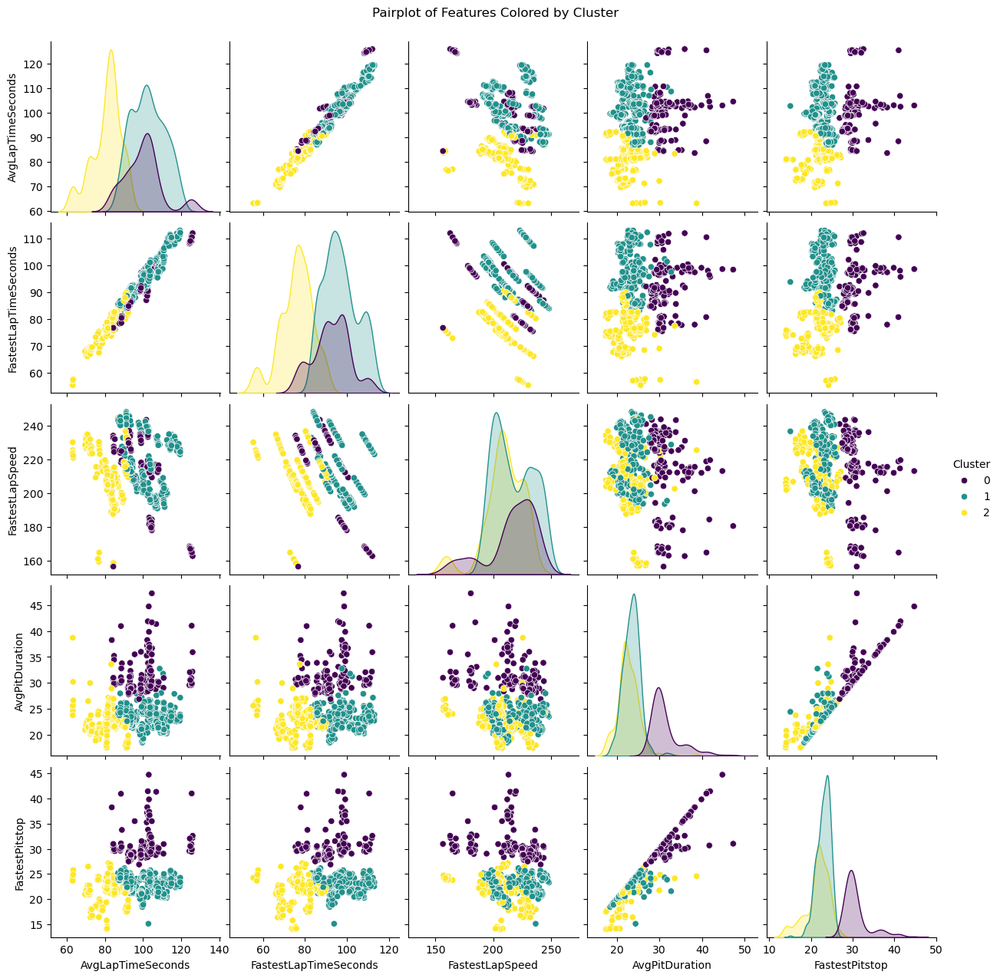

In [5]:
# Manhattan 3 M3

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 3  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="manhattan", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="manhattan")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cityblock"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="manhattan")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cityblock")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("C3cluster_summary.csv", index=False)
validity_metrics_df.to_csv("C3cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("C3medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("C3pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR AvgLapTimeSeconds (25%-75%)  \
0               0            344                  (100.5, 110.7)   
1               1            252                    (76.8, 84.5)   
2               2            173                    (91.2, 96.4)   

  IQR FastestLapTimeSeconds (25%-75%) IQR FastestLapSpeed (25%-75%)  \
0                     (95.175, 104.2)         (200.0215, 229.44425)   
1                        (69.6, 79.0)          (202.95725, 224.306)   
2                        (86.0, 91.8)             (212.817, 240.75)   

     IQR AvgPitDuration (25%-75%)  IQR FastestPitstop (25%-75%)  \
0         (23.5739166675, 29.662)            (23.19575, 29.424)   
1  (21.64275, 24.740624999999998)  (21.273249999999997, 24.153)   
2                 (21.415, 24.09)              (21.246, 23.906)   

   Average Silhouette Score  Average Distance from Medoid  
0                  0.077273                      1.839400  
1                  0.164865         

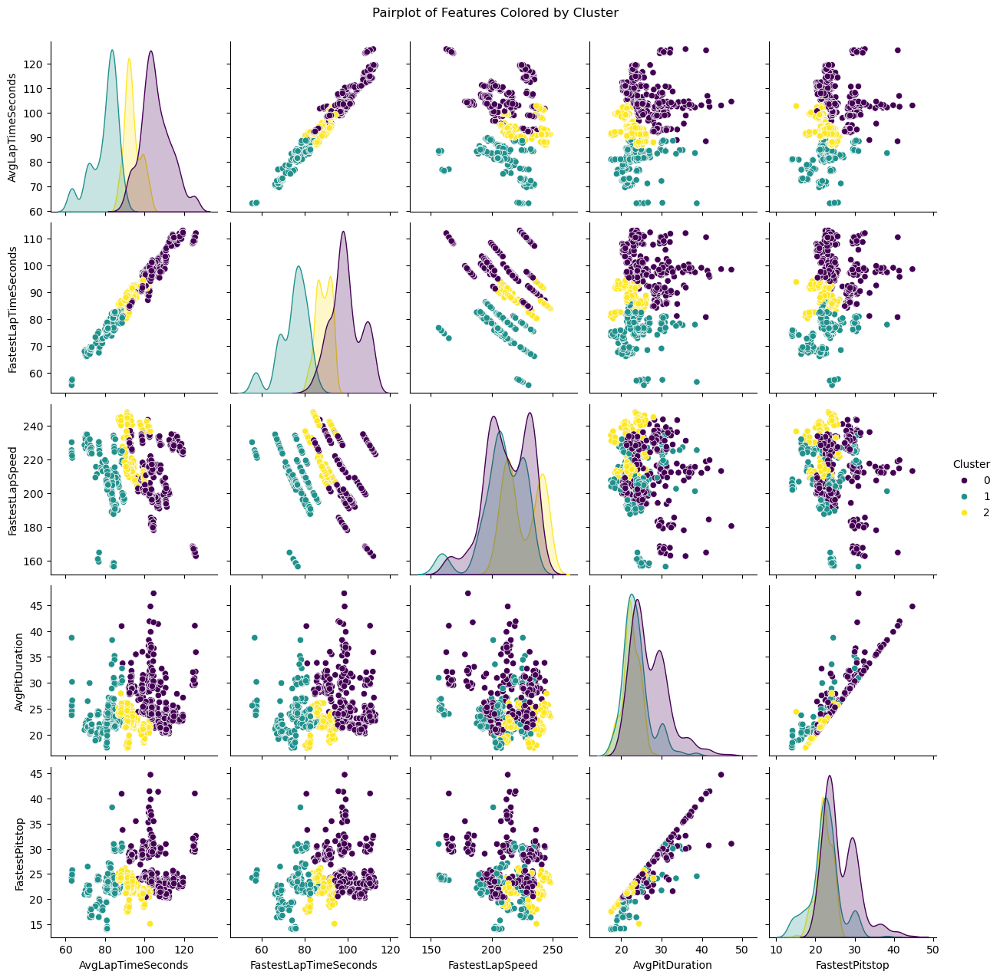

In [6]:
# Euclidean 3 E3

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 3  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="euclidean", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="euclidean")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="euclidean"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="euclidean")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="euclidean")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("C3Euccluster_summary.csv", index=False)
validity_metrics_df.to_csv("C3Euccluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("C3Eucmedoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("C3EuCpairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR AvgLapTimeSeconds (25%-75%)  \
0               0            353                  (100.2, 110.7)   
1               1            416                  (81.0, 92.025)   

  IQR FastestLapTimeSeconds (25%-75%)   IQR FastestLapSpeed (25%-75%)  \
0                       (94.5, 103.4)               (199.383, 226.55)   
1                        (75.3, 86.6)  (207.00175000000002, 230.4115)   

      IQR AvgPitDuration (25%-75%) IQR FastestPitstop (25%-75%)  \
0                  (23.161, 29.55)             (22.843, 29.369)   
1  (21.591874999999998, 24.815125)           (21.319, 24.37575)   

   Average Silhouette Score  Average Distance from Medoid  
0                  0.498879                      0.424431  
1                  0.435450                      0.454840  

Validity Metrics:
                 Metric       Value
0      Silhouette Index    0.464566
1  Davies-Bouldin Index    1.413753
2               Inertia  339.037558
3          Av

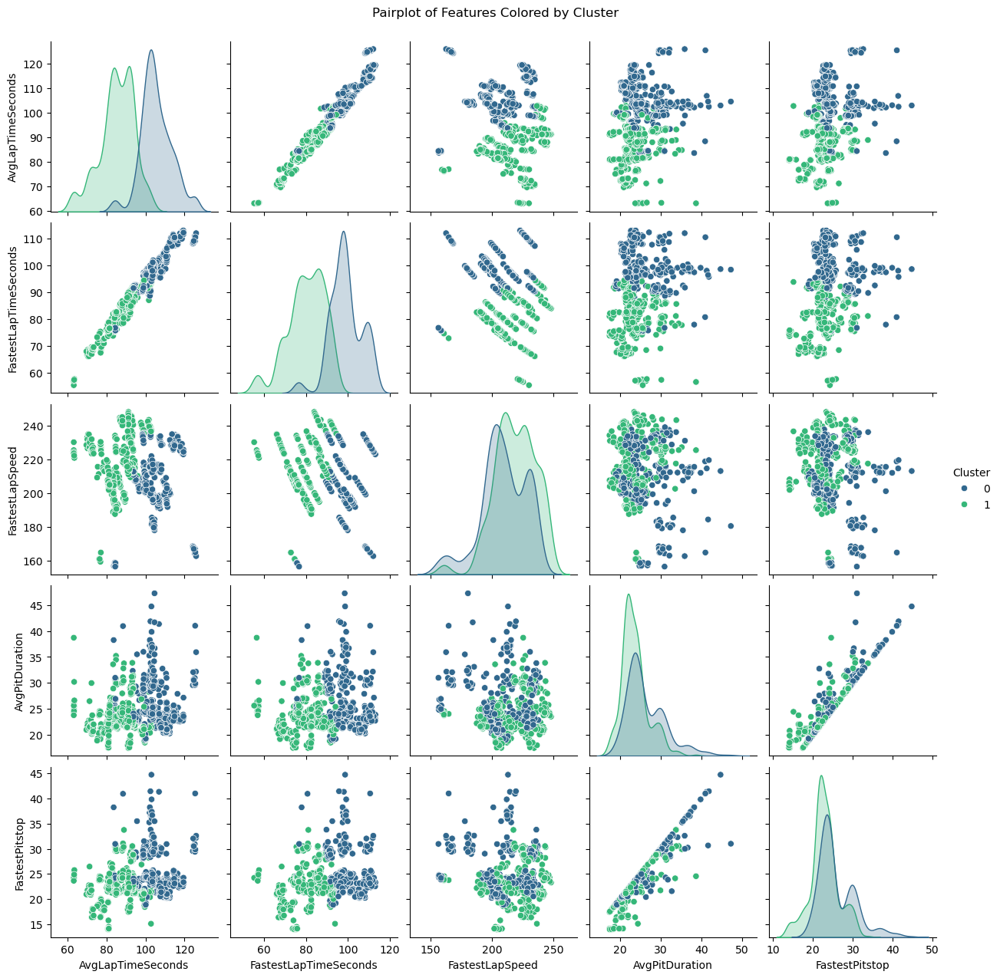

In [7]:
# Cosine 2 C2

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 2  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="cosine", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="cosine")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cosine"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="cosine")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cosine")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("C2COScluster_summary.csv", index=False)
validity_metrics_df.to_csv("C2COScluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("C2COSmedoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("C2COSpairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR AvgLapTimeSeconds (25%-75%)  \
0               0            272                (101.2, 111.725)   
1               1            201                   (90.3, 102.3)   
2               2            296     (77.89999999999999, 89.325)   

  IQR FastestLapTimeSeconds (25%-75%)  IQR FastestLapSpeed (25%-75%)  \
0                    (94.975, 107.05)           (199.108, 228.33625)   
1                        (85.5, 97.0)             (215.724, 237.017)   
2                        (73.6, 82.6)  (204.313, 221.10899999999998)   

  IQR AvgPitDuration (25%-75%) IQR FastestPitstop (25%-75%)  \
0           (22.108, 24.90225)          (21.8285, 24.26975)   
1            (26.94, 31.18325)             (25.799, 30.382)   
2          (21.48125, 23.7755)         (21.16725, 23.42025)   

   Average Silhouette Score  Average Distance from Medoid  
0                  0.528946                      0.268075  
1                  0.570534                     

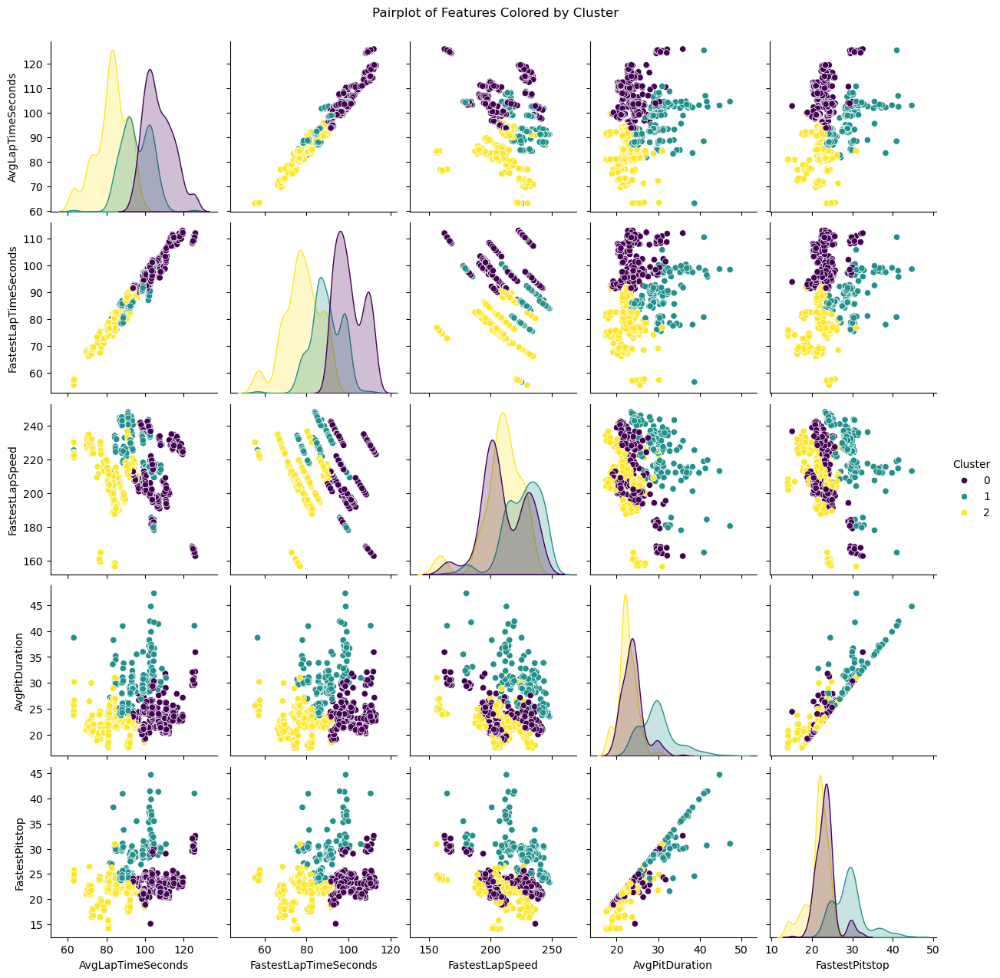

In [3]:
# Cosine 3 C3

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 3  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="cosine", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="cosine")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cosine"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="cosine")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cosine")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("C3COScluster_summary.csv", index=False)
validity_metrics_df.to_csv("C3COScluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("C3COSmedoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

data.to_csv("Kmedoidsdata.csv")

# Save the pairplot as a PNG file
plt.savefig("C3COSpairplot_clusters.png")
plt.show()

Cluster Summary:
   Cluster Number  Total Members IQR AvgLapTimeSeconds (25%-75%)  \
0               0            220     (103.1, 113.97500000000001)   
1               1            137                    (91.3, 98.8)   
2               2            215      (74.19999999999999, 84.05)   
3               3            197                   (91.1, 102.3)   

  IQR FastestLapTimeSeconds (25%-75%) IQR FastestLapSpeed (25%-75%)  \
0                     (97.1, 108.225)         (198.0385, 224.66325)   
1                        (87.6, 92.4)            (209.629, 232.039)   
2                       (68.9, 79.45)          (200.7445, 223.4745)   
3                        (85.6, 97.0)             (215.87, 237.049)   

      IQR AvgPitDuration (25%-75%) IQR FastestPitstop (25%-75%)  \
0  (23.041375, 25.215249999999997)          (22.68325, 24.4135)   
1                 (20.059, 22.337)              (19.697, 22.16)   
2               (21.732, 24.36475)             (21.349, 23.905)   
3                 

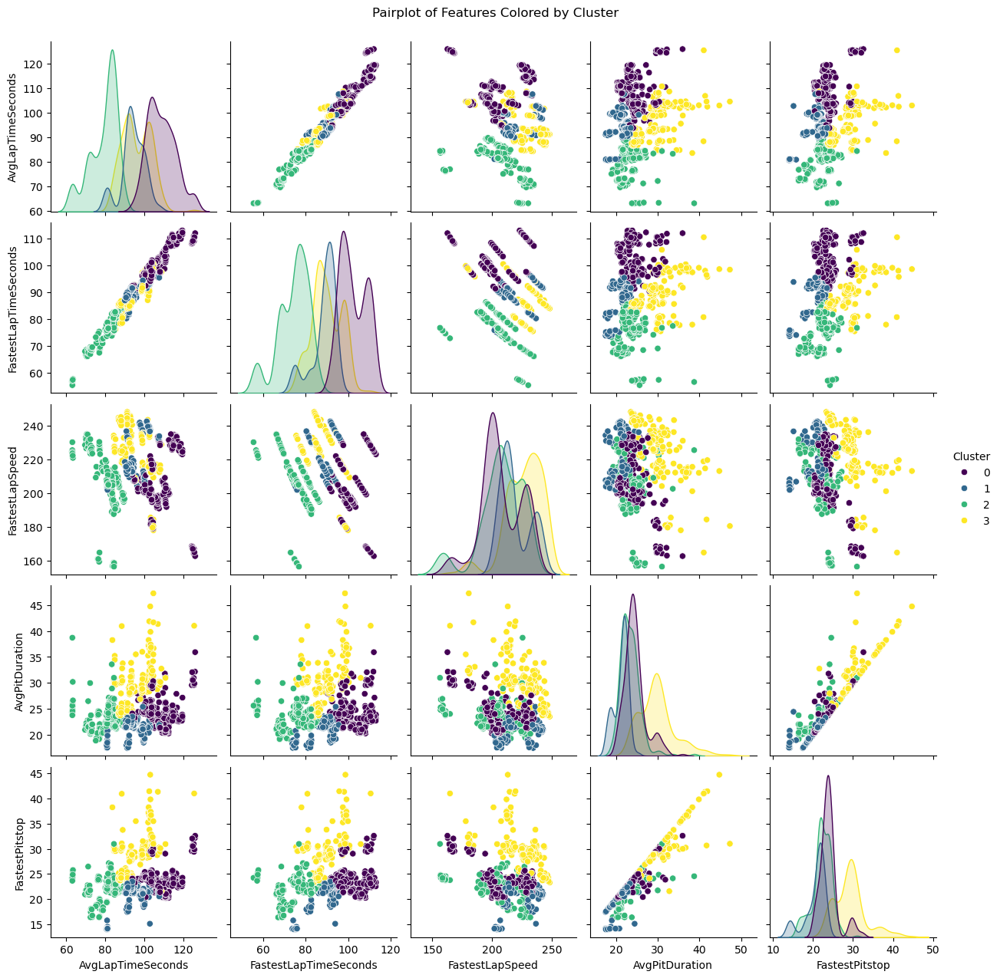

In [9]:
# Cosine 4 C4

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 4  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="cosine", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="cosine")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cosine"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="cosine")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cosine")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("C4COScluster_summary.csv", index=False)
validity_metrics_df.to_csv("C4COScluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("C4COSmedoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("C4COSpairplot_clusters.png")
plt.show()

Cluster Summary:
   Cluster Number  Total Members IQR AvgLapTimeSeconds (25%-75%)  \
0               0            227    (103.05, 113.69999999999999)   
1               1            150                  (76.825, 92.2)   
2               2            125                    (84.5, 93.4)   
3               3            187                  (91.2, 102.45)   
4               4             80       (75.35000000000001, 83.3)   

  IQR FastestLapTimeSeconds (25%-75%)   IQR FastestLapSpeed (25%-75%)  \
0                     (96.85, 108.15)   (198.14249999999998, 225.773)   
1           (69.0, 88.02499999999999)           (215.56025, 234.6875)   
2                        (80.7, 90.7)              (193.227, 211.162)   
3                       (85.8, 97.25)              (215.661, 235.953)   
4         (72.625, 76.92500000000001)  (205.04174999999998, 215.6555)   

               IQR AvgPitDuration (25%-75%)   IQR FastestPitstop (25%-75%)  \
0                        (22.8825, 25.1665)  (22.5845, 24

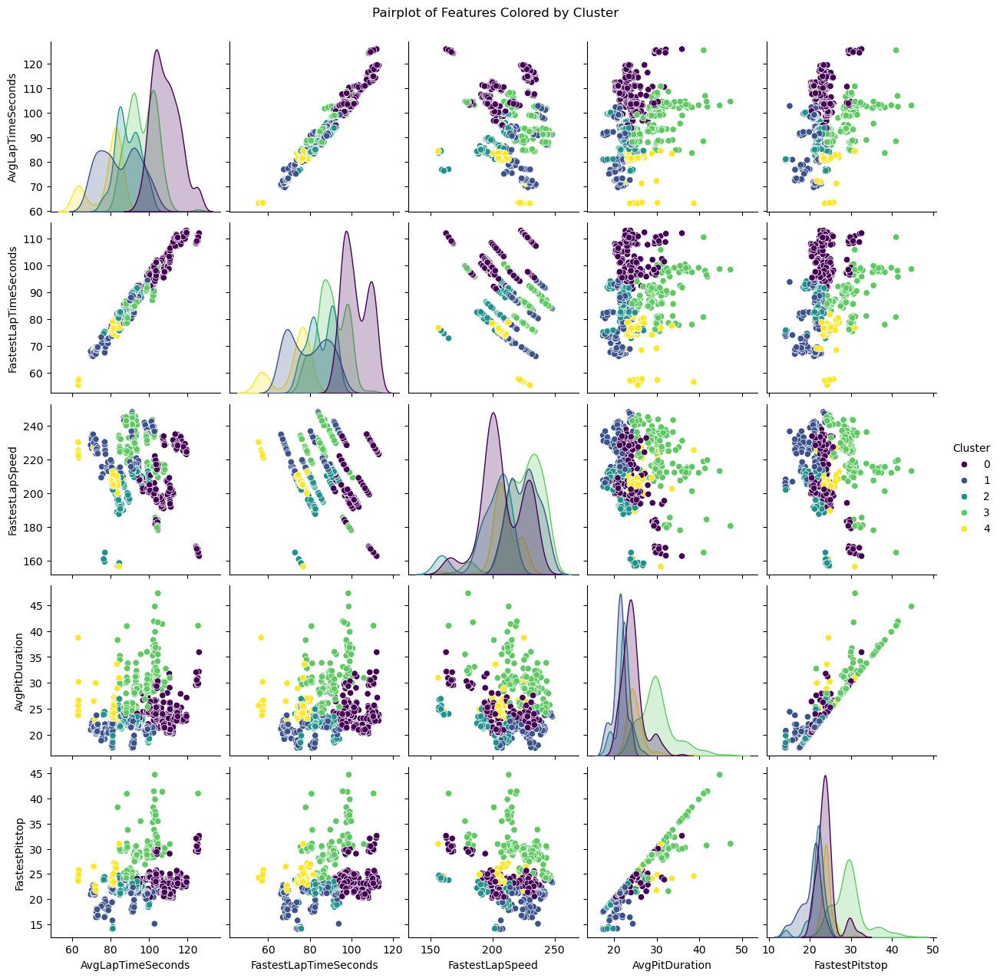

In [10]:
# Cosine 5 C5

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 5  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="cosine", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="cosine")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cosine"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="cosine")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cosine")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("C5COScluster_summary.csv", index=False)
validity_metrics_df.to_csv("C5COScluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("C5COSmedoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("C5COSpairplot_clusters.png")
plt.show()

In [2]:
data = pd.read_csv('C:\\Users\\VIPIN\\Desktop\\MSc\\MSc DAPM 38157\\Assignment 2\\CSVDatasetModified.csv')
data

,UniqueID,RaceID,RaceName,DriverID,DriverName,DriverFullName,Constructor,QualifyID,StatusID,Status,...,PositionOrder,Points,FastestLapTimeSeconds,FastestLapSpeed,TotalPitstops,AvgPitDuration,FastestPitstop,Qualyfing1Seconds,Qualyfing2Seconds,Qualyfing3Seconds
0,1031_1,1031,Austrian Grand Prix,1,hamilton,Lewis Hamilton,Mercedes,8379,1,Finished,...,4,12,67.7,229.572,2,19.107500,16.365,64.2,63.1,63.0
1,1031_20,1031,Austrian Grand Prix,20,vettel,Sebastian Vettel,Ferrari,8388,1,Finished,...,10,1,68.6,226.524,3,21.433000,19.330,64.6,64.2,0.0
2,1031_815,1031,Austrian Grand Prix,815,perez,Sergio Pérez,Racing Point,8383,1,Finished,...,6,8,68.3,227.579,2,19.464500,16.546,64.5,63.9,63.9
3,1031_822,1031,Austrian Grand Prix,822,bottas,Valtteri Bottas,Mercedes,8378,1,Finished,...,1,25,67.7,229.758,2,19.172000,16.407,64.1,63.0,62.9
4,1031_832,1031,Austrian Grand Prix,832,sainz,Carlos Sainz,McLaren,8385,1,Finished,...,5,10,68.0,228.687,3,21.898667,20.064,64.5,64.0,64.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
764,1120_847,1120,Abu Dhabi Grand Prix,847,russell,George Russell,Mercedes,10056,1,Finished,...,3,15,88.2,215.582,2,21.867000,21.650,84.3,84.0,83.8
765,1120_848,1120,Abu Dhabi Grand Prix,848,albon,Alexander Albon,Williams,10066,1,Finished,...,14,0,87.8,216.422,2,22.044500,21.919,84.3,84.4,0.0
766,1120_852,1120,Abu Dhabi Grand Prix,852,tsunoda,Yuki Tsunoda,AlphaTauri,10058,1,Finished,...,8,4,89.3,213.000,1,21.486000,21.486,84.3,84.2,84.0
767,1120_855,1120,Abu Dhabi Grand Prix,855,zhou,Zhou Guanyu,Alfa Romeo,10071,1,Finished,...,17,0,88.7,214.224,2,22.606000,22.345,85.2,0.0,0.0


Cluster Summary:
   Cluster Number  Total Members IQR AvgLapTimeSeconds (25%-75%)  \
0               0            220     (103.1, 113.97500000000001)   
1               1             91                   (72.1, 81.05)   
2               2             67                   (83.65, 86.5)   
3               3            133                    (91.5, 98.8)   
4               4             73                    (72.2, 83.3)   
5               5            185                   (91.2, 102.5)   

  IQR FastestLapTimeSeconds (25%-75%)   IQR FastestLapSpeed (25%-75%)  \
0                     (97.1, 108.225)           (198.0385, 224.66325)   
1           (68.1, 78.30000000000001)  (214.17399999999998, 230.0935)   
2                        (79.1, 82.3)  (188.8315, 199.73149999999998)   
3                        (88.1, 92.5)               (210.51, 232.365)   
4                        (69.1, 76.8)              (205.051, 220.892)   
5                        (85.8, 97.3)              (215.598, 235.731

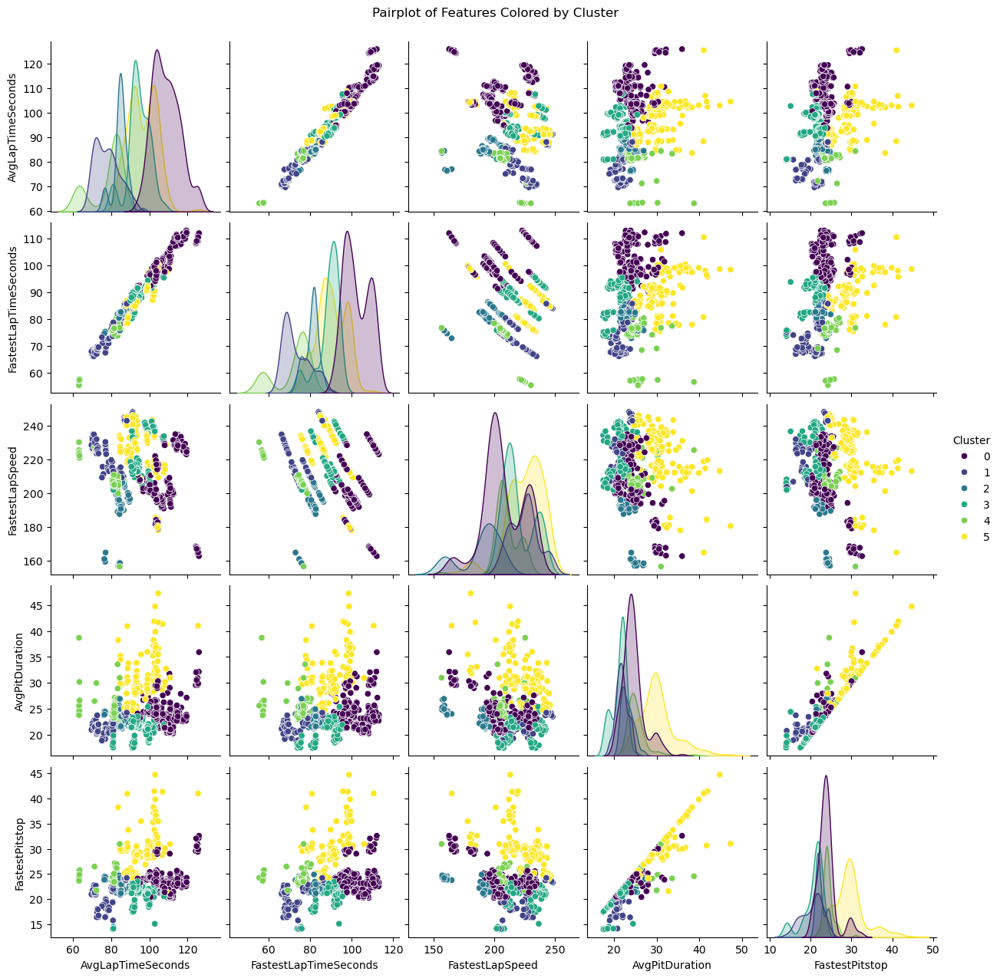

In [3]:
# Cosine 6 C6

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 6  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="cosine", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="cosine")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cosine"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="cosine")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cosine")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cosine")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("C6COScluster_summary.csv", index=False)
validity_metrics_df.to_csv("C6COScluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("C6COSmedoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("C6COSpairplot_clusters.png")
plt.show()

Cluster Summary:
   Cluster Number  Total Members          IQR AvgLapTimeSeconds (25%-75%)  \
0               0            204  (93.57499999999999, 104.42500000000001)   
1               1            565                            (83.2, 102.2)   

  IQR FastestLapTimeSeconds (25%-75%) IQR FastestLapSpeed (25%-75%)  \
0                       (89.75, 99.0)           (201.1055, 231.462)   
1                        (76.7, 95.6)            (204.084, 228.177)   

  IQR AvgPitDuration (25%-75%)    IQR FastestPitstop (25%-75%)  \
0    (28.3882499975, 31.25725)  (28.164250000000003, 30.55475)   
1              (21.615, 24.19)                (21.353, 23.848)   

   Average Silhouette Score  Average Distance from Medoid  
0                  0.311615                      3.167193  
1                  0.342453                      3.214703  

Validity Metrics:
                 Metric        Value
0      Silhouette Index     0.334272
1  Davies-Bouldin Index     1.318216
2               Inertia  246

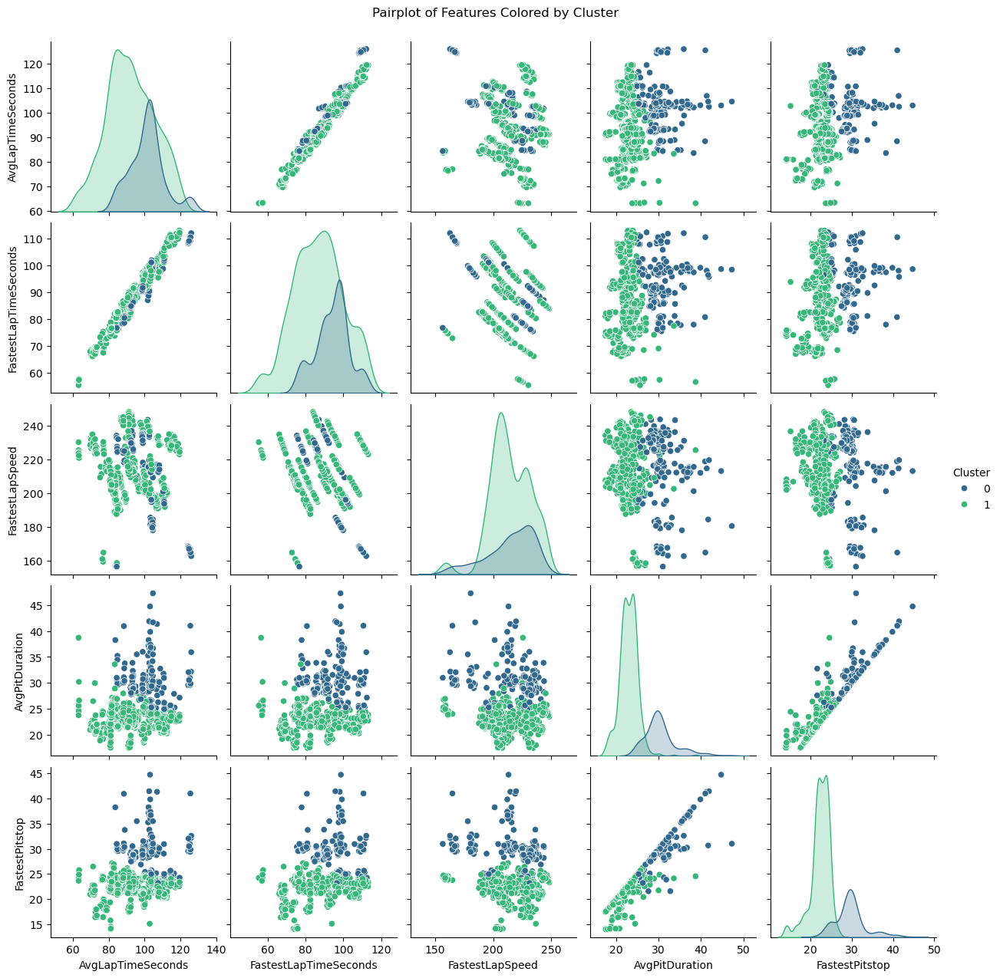

In [5]:
# Manhattan 2 M2

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 2  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="manhattan", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="manhattan")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cityblock"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="manhattan")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cityblock")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("M2cluster_summary.csv", index=False)
validity_metrics_df.to_csv("M2cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("M2medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("M2pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR AvgLapTimeSeconds (25%-75%)  \
0               0            184     (103.0, 113.64999999999999)   
1               1            167                   (93.2, 103.8)   
2               2            195                    (91.2, 98.6)   
3               3            223                   (75.65, 83.7)   

  IQR FastestLapTimeSeconds (25%-75%)  \
0                   (97.275, 108.125)   
1                        (87.8, 98.2)   
2                       (86.05, 92.4)   
3                        (69.0, 78.9)   

              IQR FastestLapSpeed (25%-75%)  \
0           (198.61450000000002, 224.66325)   
1                        (212.192, 232.376)   
2            (212.8015, 239.59550000000002)   
3  (202.92849999999999, 223.13400000000001)   

         IQR AvgPitDuration (25%-75%)   IQR FastestPitstop (25%-75%)  \
0               (23.041375, 24.90225)            (22.6945, 24.30725)   
1      (29.305999999999997, 32.12675)  (28.8405, 30.8635

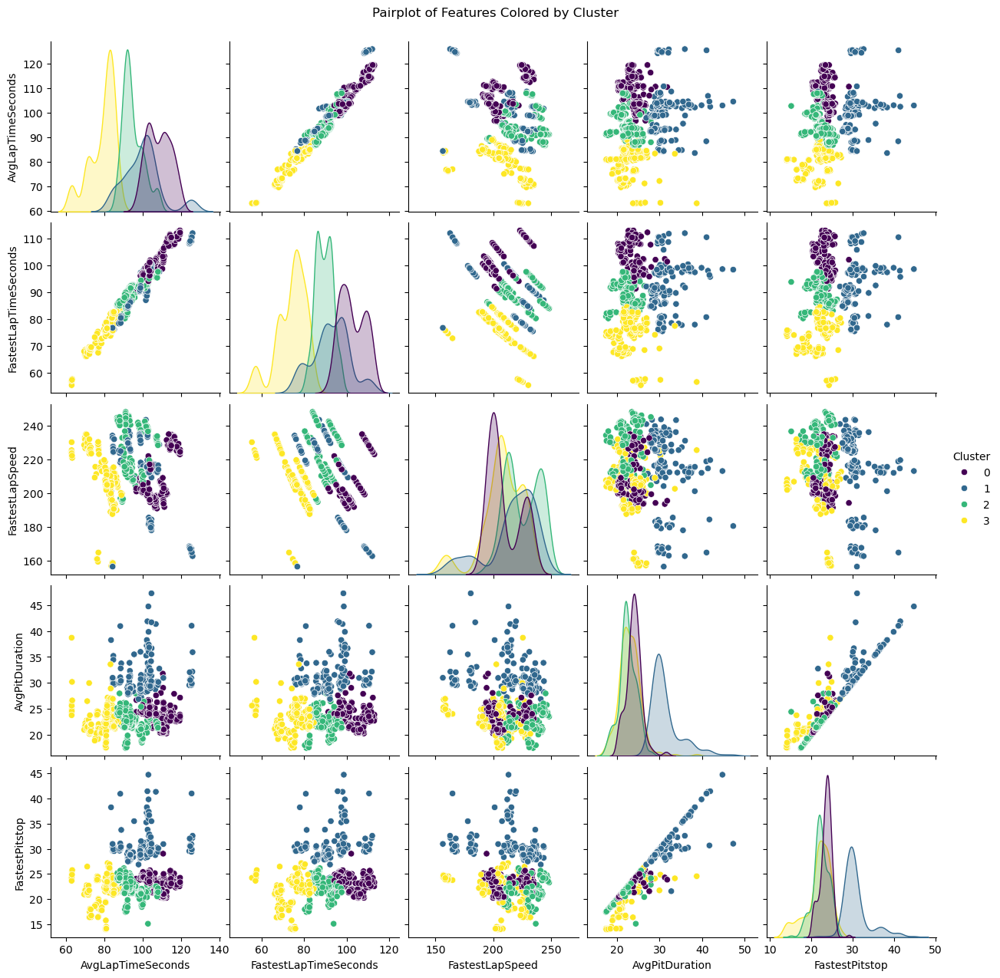

In [6]:
# Manhattan 4 M4

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 4  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="manhattan", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="manhattan")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cityblock"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="manhattan")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cityblock")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("M4cluster_summary.csv", index=False)
validity_metrics_df.to_csv("M4cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("M4medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("M4pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members          IQR AvgLapTimeSeconds (25%-75%)  \
0               0            161                            (99.8, 109.1)   
1               1            164                        (93.275, 103.825)   
2               2            124  (98.07499999999999, 114.92500000000001)   
3               3            112                           (80.775, 84.2)   
4               4            208                (78.52499999999999, 91.2)   

  IQR FastestLapTimeSeconds (25%-75%)    IQR FastestLapSpeed (25%-75%)  \
0                       (94.8, 101.4)                 (198.4, 206.151)   
1                       (88.65, 98.3)  (212.26575, 232.48250000000002)   
2                     (91.9, 109.825)           (229.00625, 240.77175)   
3          (74.57499999999999, 78.85)             (204.029, 223.46475)   
4                     (72.65, 87.075)  (205.59425, 224.80724999999998)   

          IQR AvgPitDuration (25%-75%)  \
0                (22.442, 24.8776

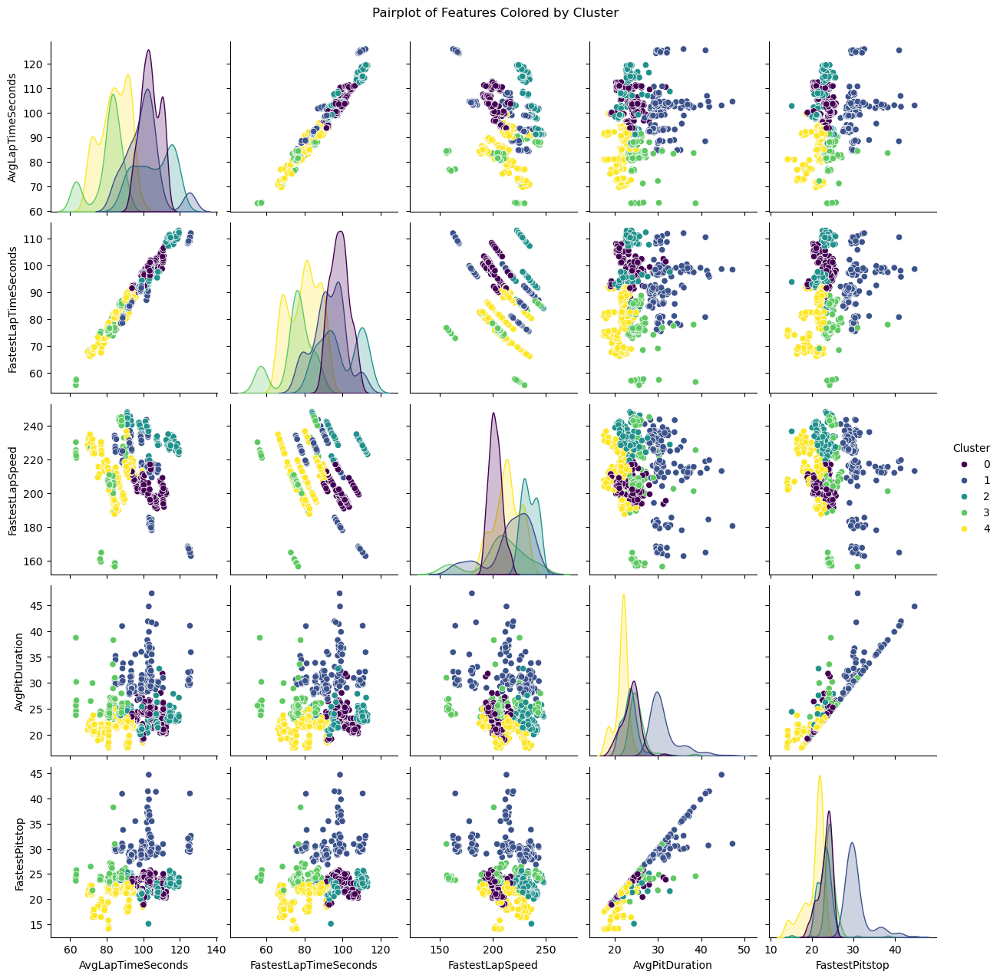

In [7]:
# Manhattan 5 M5

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 5  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="manhattan", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="manhattan")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cityblock"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="manhattan")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cityblock")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("M5cluster_summary.csv", index=False)
validity_metrics_df.to_csv("M5cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("M5medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("M5pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR AvgLapTimeSeconds (25%-75%)  \
0               0            165                   (93.3, 103.9)   
1               1             73                  (112.4, 116.4)   
2               2            148                    (81.1, 84.5)   
3               3            180                  (91.0, 96.225)   
4               4             75                  (70.05, 75.65)   
5               5            128   (102.375, 109.19999999999999)   

  IQR FastestLapTimeSeconds (25%-75%)  \
0                        (88.7, 98.3)   
1                      (107.5, 110.8)   
2                        (75.5, 80.5)   
3                        (85.9, 91.8)   
4                       (66.45, 69.0)   
5                      (96.5, 101.55)   

              IQR FastestLapSpeed (25%-75%)    IQR AvgPitDuration (25%-75%)  \
0                         (212.29, 232.399)               (29.302, 32.0865)   
1                        (225.777, 232.279)                (

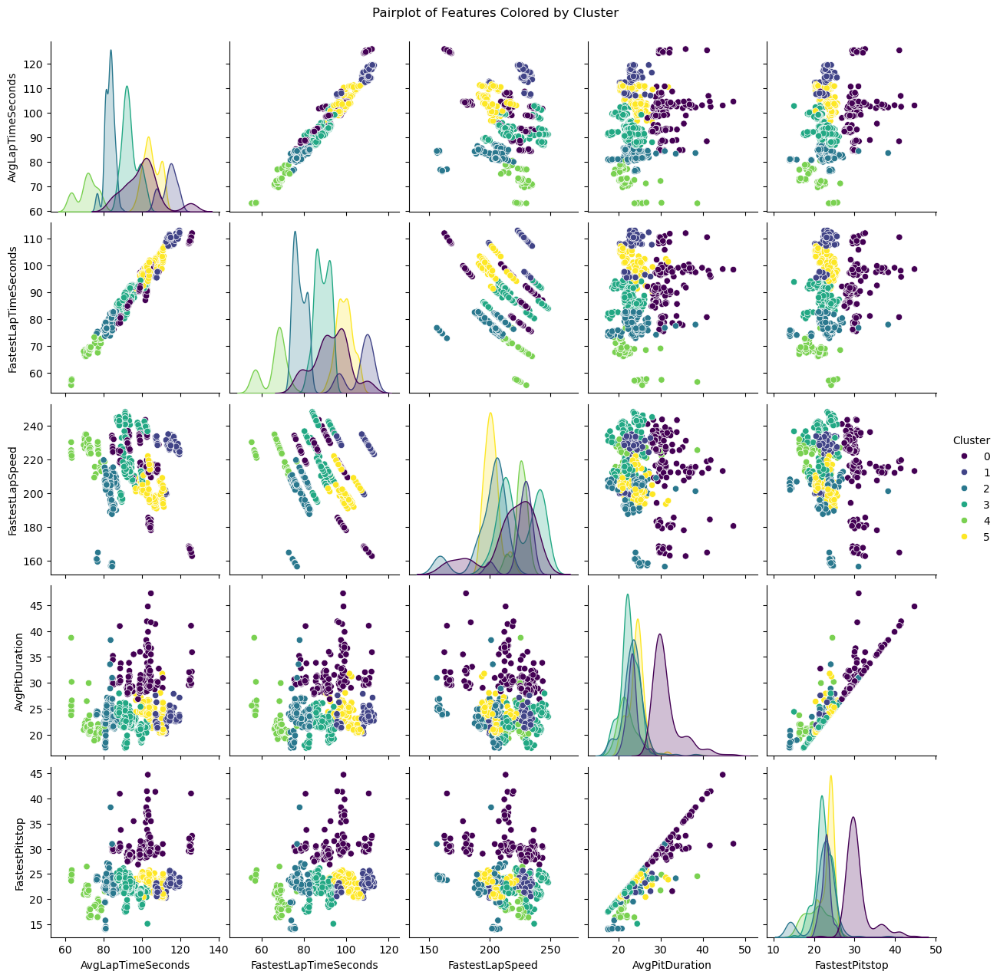

In [8]:
# Manhattan 6 M6

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 6  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="manhattan", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="manhattan")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="cityblock"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="manhattan")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="cityblock")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="cityblock")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("M6cluster_summary.csv", index=False)
validity_metrics_df.to_csv("M6cluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("M6medoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("M6pairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR AvgLapTimeSeconds (25%-75%)  \
0               0            454                 (98.125, 107.7)   
1               1            315      (78.69999999999999, 87.05)   

  IQR FastestLapTimeSeconds (25%-75%) IQR FastestLapSpeed (25%-75%)  \
0          (91.3, 100.85000000000001)           (202.2265, 232.341)   
1                        (73.9, 82.5)            (204.711, 224.988)   

     IQR AvgPitDuration (25%-75%)              IQR FastestPitstop (25%-75%)  \
0  (23.065375000000003, 29.26875)                         (22.701, 28.8125)   
1  (21.524250000000002, 24.24325)  (21.237000000000002, 23.887999999999998)   

   Average Silhouette Score  Average Distance from Medoid  
0                  0.219432                      1.838295  
1                  0.366946                      1.455449  

Validity Metrics:
                 Metric        Value
0      Silhouette Index     0.279857
1  Davies-Bouldin Index     1.317204
2               

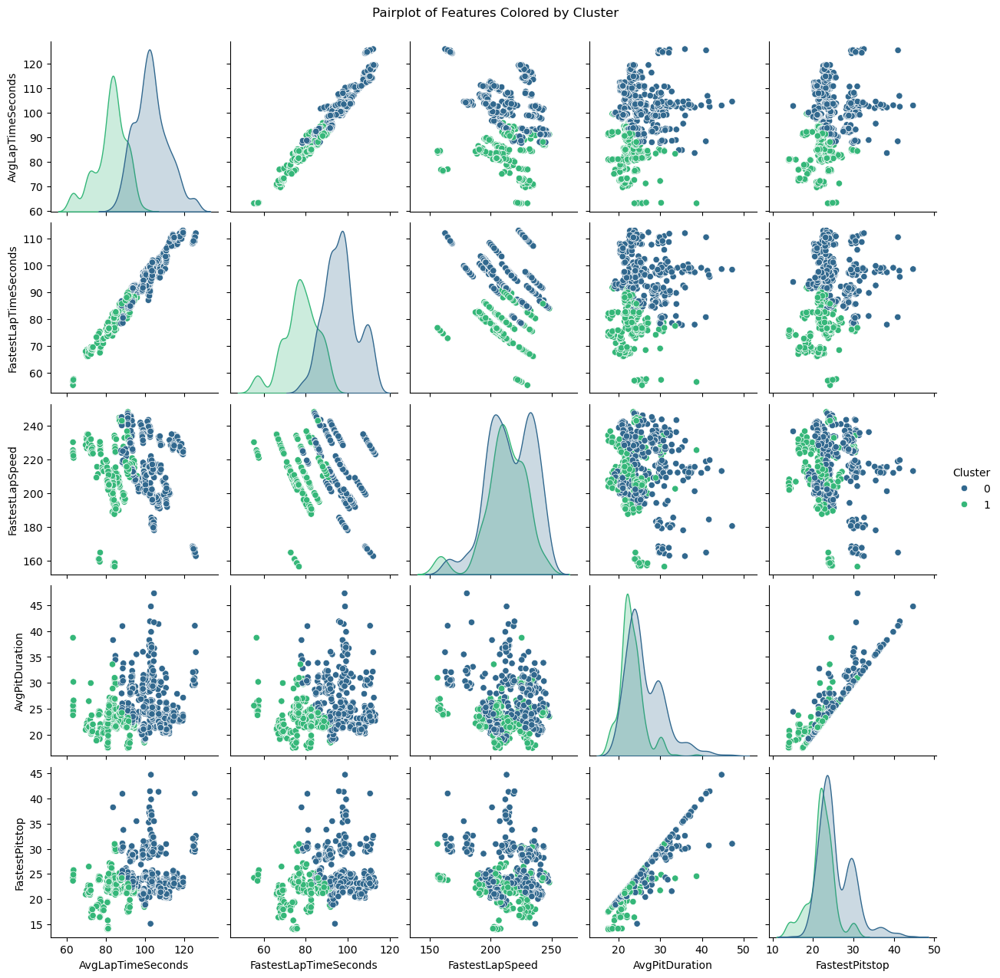

In [9]:
# Euclidean 2 E2

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 2  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="euclidean", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="euclidean")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="euclidean"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="euclidean")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="euclidean")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("E2Euccluster_summary.csv", index=False)
validity_metrics_df.to_csv("E2Euccluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("E2Eucmedoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("E2EuCpairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR AvgLapTimeSeconds (25%-75%)  \
0               0            146               (93.525, 103.875)   
1               1            288                    (77.1, 86.9)   
2               2            100       (90.4, 98.92500000000001)   
3               3            235                  (100.2, 112.4)   

  IQR FastestLapTimeSeconds (25%-75%)  IQR FastestLapSpeed (25%-75%)  \
0                    (89.225, 98.275)         (212.21725, 231.22975)   
1                      (72.775, 82.2)  (204.233, 222.26749999999998)   
2                        (85.5, 92.8)          (234.0645, 242.93275)   
3                     (95.95, 107.65)  (199.46699999999998, 219.066)   

     IQR AvgPitDuration (25%-75%) IQR FastestPitstop (25%-75%)  \
0            (29.4885, 32.373875)         (29.20225, 31.05625)   
1  (21.48125, 23.987125000000002)         (21.16725, 23.49475)   
2             (21.934625, 25.646)          (21.4225, 25.26775)   
3    (22.587, 24.

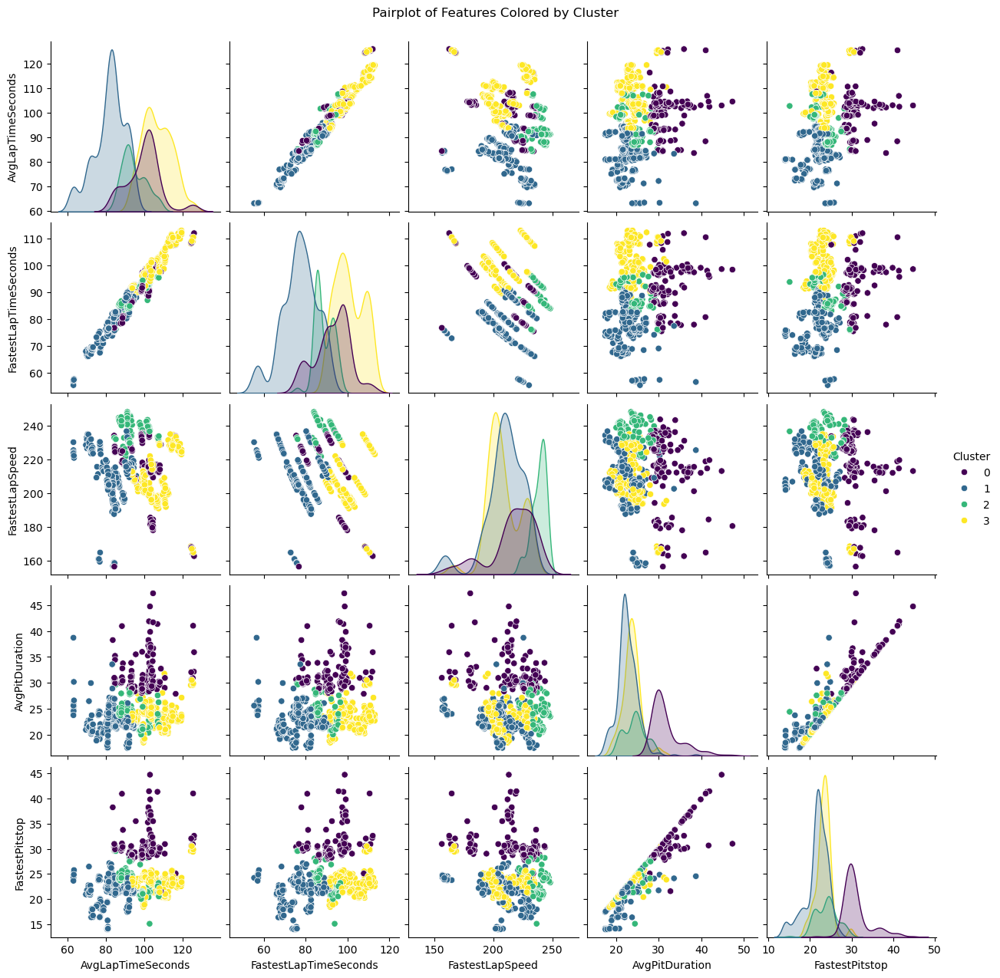

In [10]:
# Euclidean 4 E4

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 4  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="euclidean", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="euclidean")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="euclidean"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="euclidean")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="euclidean")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("E4Euccluster_summary.csv", index=False)
validity_metrics_df.to_csv("E4Euccluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("E4Eucmedoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("E4EuCpairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR AvgLapTimeSeconds (25%-75%)  \
0               0            143                  (92.95, 102.7)   
1               1            154                (102.8, 110.675)   
2               2            134                   (92.9, 114.7)   
3               3            110                   (91.3, 96.05)   
4               4            228                 (76.05, 83.725)   

  IQR FastestLapTimeSeconds (25%-75%)  IQR FastestLapSpeed (25%-75%)  \
0                       (86.35, 97.6)           (214.6725, 233.3845)   
1                     (97.1, 103.275)           (194.60125, 202.767)   
2                    (86.175, 109.05)          (229.4495, 242.16625)   
3         (87.64999999999999, 91.675)  (210.931, 217.29025000000001)   
4                      (69.0, 79.225)          (201.86775, 222.9615)   

      IQR AvgPitDuration (25%-75%)   IQR FastestPitstop (25%-75%)  \
0             (29.04175, 32.31725)  (28.747500000000002, 30.6735)   
1  

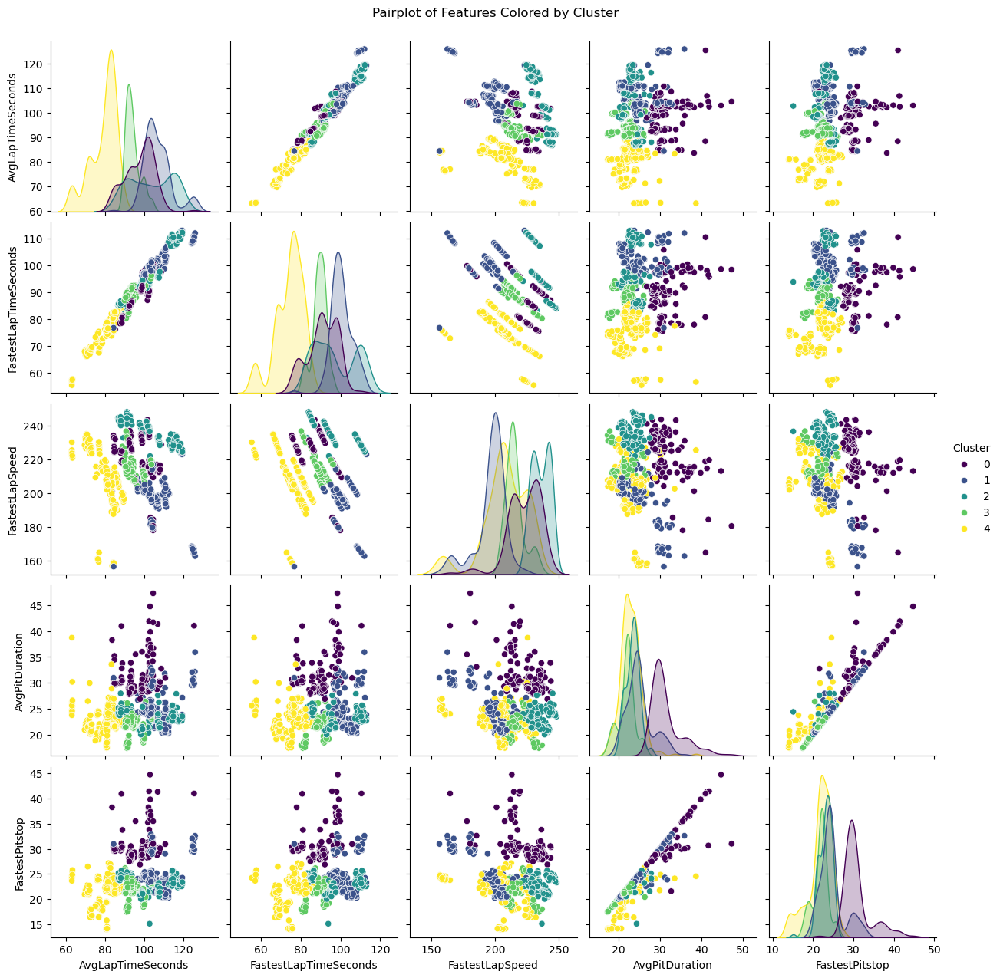

In [11]:
# Euclidean 5 E5

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 5  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="euclidean", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="euclidean")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="euclidean"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="euclidean")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="euclidean")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("E5Euccluster_summary.csv", index=False)
validity_metrics_df.to_csv("E5Euccluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("E5Eucmedoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("E5EuCpairplot_clusters.png")
plt.show()


Cluster Summary:
   Cluster Number  Total Members IQR AvgLapTimeSeconds (25%-75%)  \
0               0             69                  (112.4, 116.5)   
1               1             83                    (81.1, 85.8)   
2               2             94                  (90.5, 98.175)   
3               3            217                   (94.9, 106.4)   
4               4            151                   (71.8, 82.95)   
5               5            155                  (93.3, 103.65)   

  IQR FastestLapTimeSeconds (25%-75%) IQR FastestLapSpeed (25%-75%)  \
0                      (107.3, 110.9)            (227.169, 232.305)   
1                      (75.65, 82.25)            (190.238, 204.223)   
2                    (85.025, 91.975)          (236.264, 242.95825)   
3                       (91.4, 100.4)            (199.143, 212.258)   
4                       (68.05, 76.7)           (207.2785, 225.594)   
5                      (88.95, 98.15)           (212.3485, 232.376)   

  IQR Av

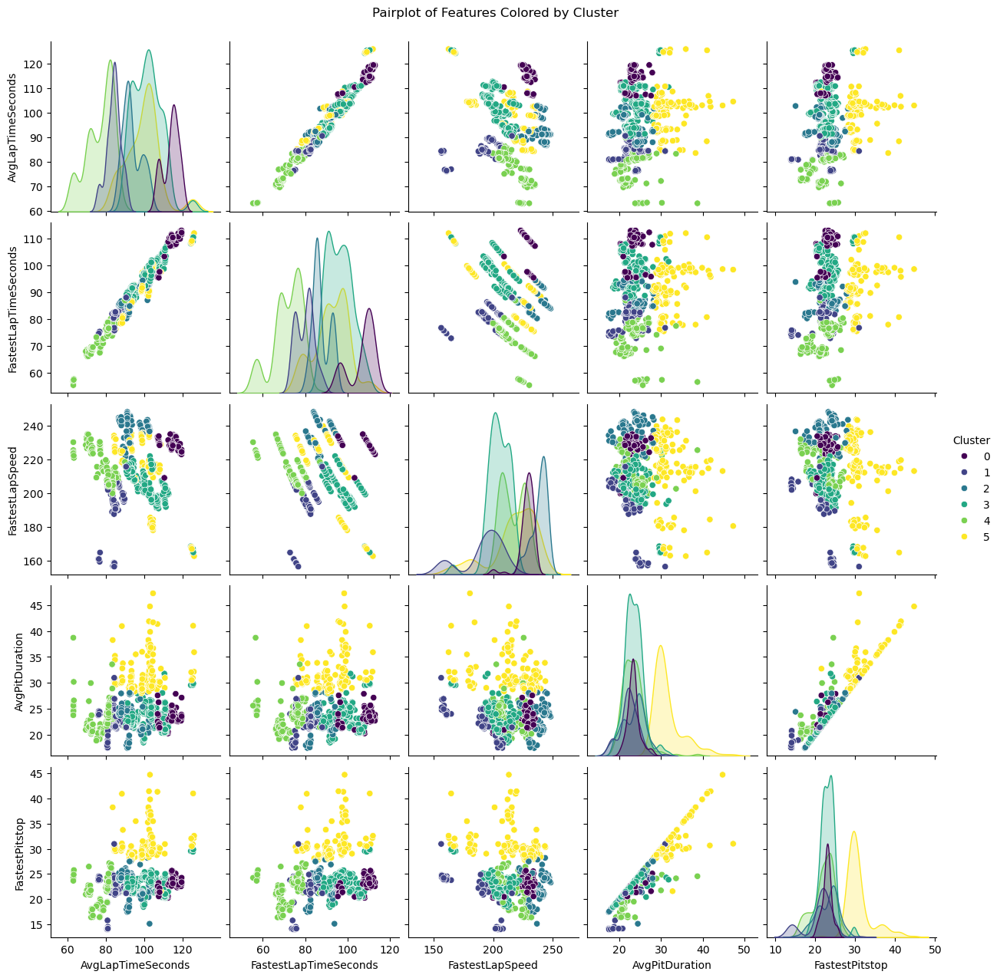

In [12]:
# Euclidean 6 E6

import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import silhouette_score, silhouette_samples, davies_bouldin_score
from sklearn_extra.cluster import KMedoids
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns

# Columns for clustering
columns = [
    "AvgLapTimeSeconds",
    "FastestLapTimeSeconds",
    "FastestLapSpeed",
    "AvgPitDuration",
    "FastestPitstop",
]

# Standardizing quantitative features
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data[columns])

# Perform K-Medoids clustering with city block distance
n_clusters = 6  # Adjust the number of clusters as needed
kmedoids = KMedoids(n_clusters=n_clusters, metric="euclidean", random_state=42)
labels = kmedoids.fit_predict(data_scaled)

# Add cluster labels to the dataframe
data["Cluster"] = labels

# Calculate validity metrics
silhouette_avg = silhouette_score(data_scaled, labels, metric="euclidean")
davies_bouldin = davies_bouldin_score(data_scaled, labels)
inertia = np.sum(
    np.min(cdist(data_scaled, kmedoids.cluster_centers_, metric="euclidean"), axis=1)
)

# Calculate per-cluster silhouette scores
silhouette_vals = silhouette_samples(data_scaled, labels, metric="euclidean")

# Create a summary table for clusters
cluster_info = []
numeric_columns = ["AvgLapTimeSeconds", "FastestLapTimeSeconds", "FastestLapSpeed", "AvgPitDuration", "FastestPitstop"]

for cluster_num in range(n_clusters):
    cluster_data = data[data["Cluster"] == cluster_num]
    cluster_data_scaled = data_scaled[data["Cluster"] == cluster_num]
    
    # Metrics for the cluster
    total_members = len(cluster_data)
    variable_iqr = {
        f"IQR {col} (25%-75%)": (np.percentile(cluster_data[col], 25), np.percentile(cluster_data[col], 75))
        for col in numeric_columns
    }
    avg_silhouette = silhouette_vals[data["Cluster"] == cluster_num].mean()
    avg_distance = np.mean(
        cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    )
    
    cluster_info.append(
        {
            "Cluster Number": cluster_num,
            "Total Members": total_members,
            **variable_iqr,
            "Average Silhouette Score": avg_silhouette,
            "Average Distance from Medoid": avg_distance,
        }
    )

# Convert cluster summary to DataFrame
cluster_summary_df = pd.DataFrame(cluster_info)

# Compute the Average Within-Cluster Sum of Squares (WCSS)
wcss_list = []
for cluster_num in range(n_clusters):
    cluster_data_scaled = data_scaled[labels == cluster_num]
    dist_to_medoid = cdist(cluster_data_scaled, [kmedoids.cluster_centers_[cluster_num]], metric="euclidean")
    wcss = np.sum(dist_to_medoid**2)  # Square of the distances
    wcss_list.append(wcss)

average_wcss = np.mean(wcss_list)

# Create a summary table for validity metrics
validity_metrics = {
    "Metric": ["Silhouette Index", "Davies-Bouldin Index", "Inertia", "Average WCSS"],
    "Value": [silhouette_avg, davies_bouldin, inertia, average_wcss],
}
validity_metrics_df = pd.DataFrame(validity_metrics)

# Compute pairwise distance matrix between each cluster's medoid
medoid_dist_matrix = cdist(kmedoids.cluster_centers_, kmedoids.cluster_centers_, metric="euclidean")
medoid_dist_matrix_df = pd.DataFrame(medoid_dist_matrix, columns=[f"Cluster {i}" for i in range(n_clusters)],
                                      index=[f"Cluster {i}" for i in range(n_clusters)])

# Output results to CSV files
cluster_summary_df.to_csv("E6Euccluster_summary.csv", index=False)
validity_metrics_df.to_csv("E6Euccluster_validity_metrics.csv", index=False)
medoid_dist_matrix_df.to_csv("E6Eucmedoid_distance_matrix.csv")

# Print the validity metrics
print("Cluster Summary:")
print(cluster_summary_df)
print("\nValidity Metrics:")
print(validity_metrics_df)
print("\nMedoid Distance Matrix:")
print(medoid_dist_matrix_df)

# Pairplot to show pairwise relationships between features
sns.pairplot(data, hue="Cluster", vars=numeric_columns, palette="viridis")
plt.suptitle("Pairplot of Features Colored by Cluster", y=1.02)

# Save the pairplot as a PNG file
plt.savefig("E6EuCpairplot_clusters.png")
plt.show()
